In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import random

import glob as gb
import cv2
import matplotlib.pylab as plt
plt.style.use('ggplot')

In [3]:
from PIL import Image
from concurrent.futures import ThreadPoolExecutor, as_completed

### Dataset source: https://www.kaggle.com/datasets/annielu21/house-rooms

In [4]:
import warnings

warnings.filterwarnings("ignore", message="All log messages before absl::InitializeLog() is called are written to STDERR")
warnings.filterwarnings("ignore", message="Fallback to op-by-op mode because memset node breaks graph update")

In [5]:
from sklearn.model_selection import train_test_split
import os
import shutil
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf

2024-06-22 08:03:05.720140: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-22 08:03:05.720302: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-22 08:03:05.896625: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [6]:
def set_random_seed(random_seed):
    random.seed(random_seed)
    np.random.seed(random_seed)
    tf.random.set_seed(random_seed)
    os.environ['PYTHONHASHSEED'] = str(random_seed)
    os.environ['TF_DETERMINISTIC_OPS'] = '1'

In [7]:
set_random_seed(42)

In [8]:
# Path gambar
img_path = '/kaggle/input/house-rooms/room-dataset'

output_dir = 'output'

# Membuat folder output jika belum ada
os.makedirs(output_dir, exist_ok=True)

In [9]:
# Membuat Folder Kategori
categories = ['bathroom', 'bedroom', 'dining', 'gaming', 
              'kitchen','laundry','living', 'office',
             'terrace', 'yard']

for category in categories:
    os.makedirs(os.path.join(output_dir, category), exist_ok=True)

Image modes found in dataset:

RGB: 11983 files

RGBA: 219 files

P: 103 files

CMYK: 15 files

L: 2 files

### Process gambar & konversi ke RGB

In [49]:
# import multiprocessing
# import time


# # Fungsi untuk memproses gambar dan mengonversi ke mode RGB jika perlu
# def process_image(source_file, category):
#     destination_dir = os.path.join(output_dir, category)
#     destination_file = os.path.join(destination_dir, os.path.basename(source_file))
    
#     try:
#         with Image.open(source_file) as img:
#             if img.mode != 'RGB':
#                 img = img.convert('RGB')
#             img.save(destination_file)
#             return img.mode
#     except Exception as e:
#         print(f"Error processing file {source_file}: {e}")
#         return None

# # Mengumpulkan file yang akan diproses
# file_infos = [(os.path.join(root, file), os.path.basename(root))
#               for root, _, files in os.walk(img_path)
#               for file in files if os.path.basename(root) in categories]

# # Menggunakan ThreadPoolExecutor untuk memproses gambar secara paralel
# image_modes = {}

# # Tentukan jumlah workers sesuai jumlah CPU yang tersedia
# num_workers = multiprocessing.cpu_count()

# # Mencatat waktu mulai
# start_time = time.time()

# with ThreadPoolExecutor(max_workers=num_workers) as executor:
#     futures = [executor.submit(process_image, source_file, category) for source_file, category in file_infos]
#     for future in as_completed(futures):
#         mode = future.result()
#         if mode:
#             image_modes[mode] = image_modes.get(mode, 0) + 1

# # Mencatat waktu selesai
# end_time = time.time()

# # Menampilkan jumlah file dalam setiap kategori
# for category in categories:
#     num_files = len(os.listdir(os.path.join(output_dir, category)))
#     print(f"Total {category} files: {num_files}")

# # Menampilkan tipe gambar yang ditemukan dalam dataset
# print("\nImage modes found in dataset:")
# for mode, count in image_modes.items():
#     print(f"{mode}: {count} files")

# # Menampilkan waktu eksekusi
# execution_time = end_time - start_time
# print(f"\nTotal execution time: {execution_time:.2f} seconds")

Total bathroom files: 740
Total bedroom files: 1083
Total dining files: 1178
Total gaming files: 1511
Total kitchen files: 1208
Total laundry files: 1589
Total living files: 1164
Total office files: 1241
Total terrace files: 1210
Total yard files: 1398

Image modes found in dataset:
RGB: 12322 files

Total execution time: 271.11 seconds


In [99]:
import multiprocessing
import time
from joblib import Parallel, delayed

def process_image(source_file, category):
    destination_dir = os.path.join(output_dir, category)
    destination_file = os.path.join(destination_dir, os.path.basename(source_file))
    
    try:
        with Image.open(source_file) as img:
            if img.mode != 'RGB':
                img = img.convert('RGB')
            img.save(destination_file)
            return img.mode
    except Exception as e:
        print(f"Error processing file {source_file}: {e}")
        return None

if __name__ == '__main__':
    # Mengumpulkan file yang akan diproses
    file_infos = [(os.path.join(root, file), os.path.basename(root))
                  for root, _, files in os.walk(img_path)
                  for file in files if os.path.basename(root) in categories]

    # Tentukan jumlah workers sesuai jumlah CPU yang tersedia
    num_workers = multiprocessing.cpu_count()

    # Mencatat waktu mulai
    start_time = time.time()

    # Memproses gambar dengan joblib
    results = Parallel(n_jobs=num_workers)(delayed(process_image)(*file_info) for file_info in file_infos)

    # Mencatat waktu selesai
    end_time = time.time()

    # Menampilkan jumlah file dalam setiap kategori
    for category in categories:
        num_files = len(os.listdir(os.path.join(output_dir, category)))
        print(f"Total {category} files: {num_files}")

    # Menampilkan tipe gambar yang ditemukan dalam dataset
    image_modes = {}
    for mode in results:
        if mode:
            image_modes[mode] = image_modes.get(mode, 0) + 1

    print("\nImage modes found in dataset:")
    for mode, count in image_modes.items():
        print(f"{mode}: {count} files")

    # Menampilkan waktu eksekusi
    execution_time = end_time - start_time
    print(f"\nTotal execution time: {execution_time:.2f} seconds")

/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/PIL/TiffImagePlugin.py:864: UserWarning: Truncated File Read
  warnings.warn(str(msg))
/opt/conda/lib/python3.10/site-packages/PIL/TiffImagePlugin.py:864: UserWarning: Truncated File Read
  warnings.warn(str(msg))
/opt/conda/lib/python3.10/site-packages/PIL/TiffImagePlugin.py:864: UserWarning: Truncated File Read
  warnings.warn(str(msg))


Total bathroom files: 740
Total bedroom files: 1083
Total dining files: 1178
Total gaming files: 1511
Total kitchen files: 1208
Total laundry files: 1589
Total living files: 1164
Total office files: 1241
Total terrace files: 1210
Total yard files: 1398

Image modes found in dataset:
RGB: 12322 files

Total execution time: 295.42 seconds


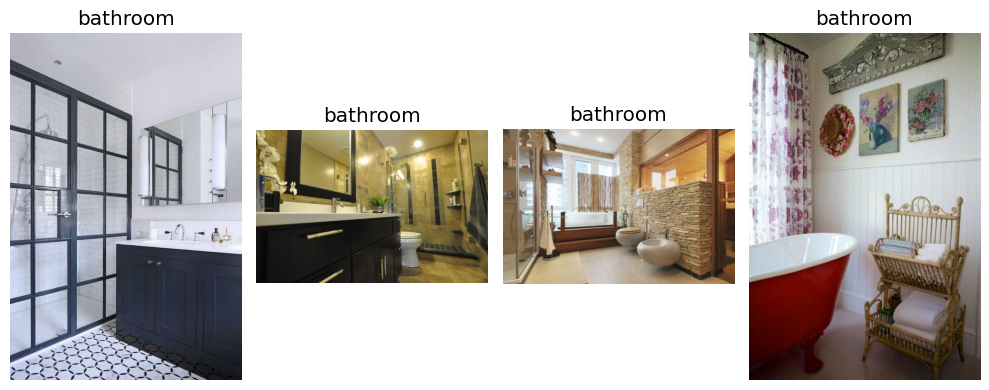

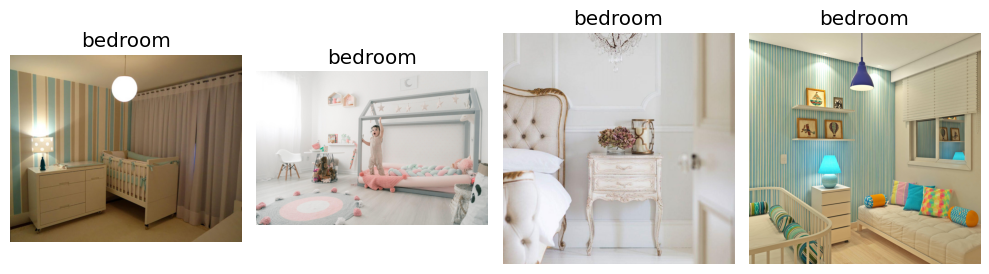

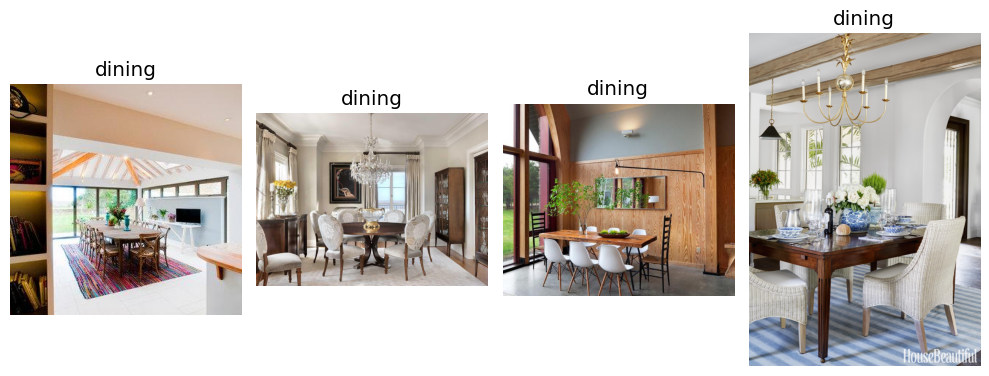

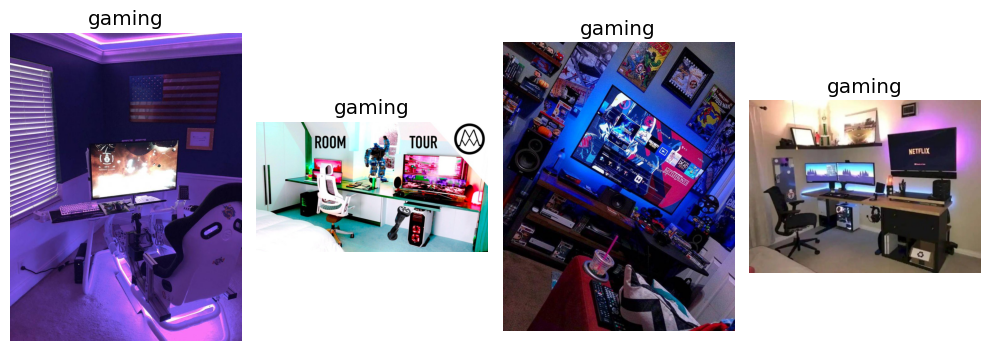

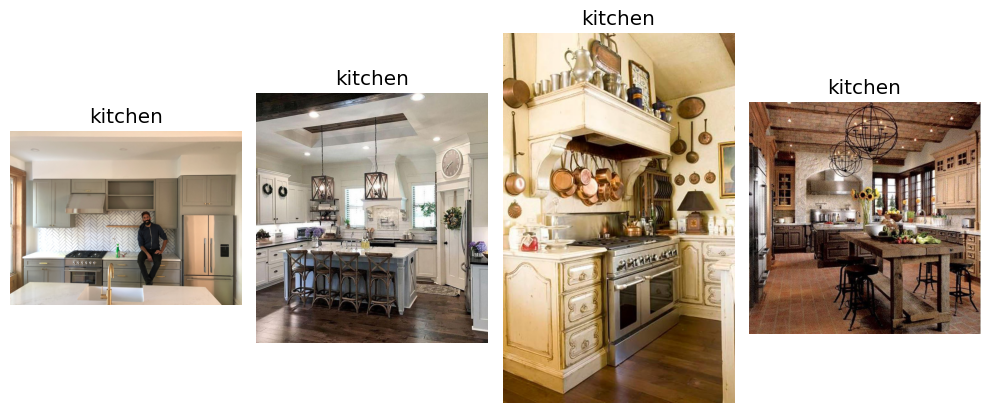

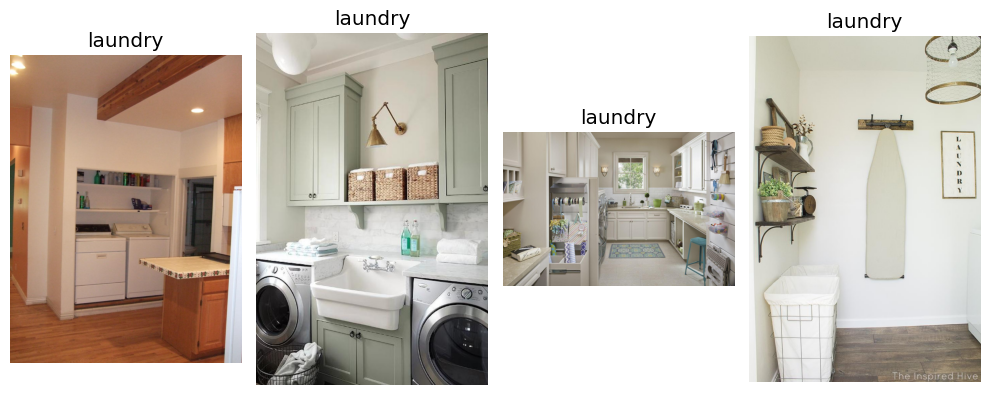

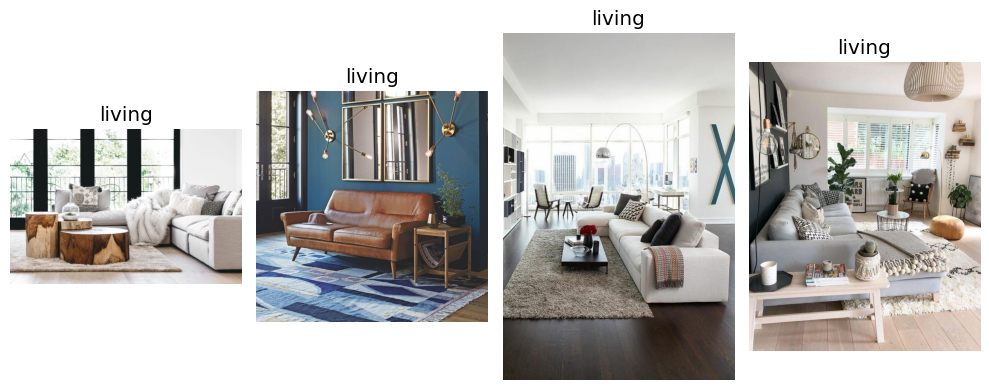

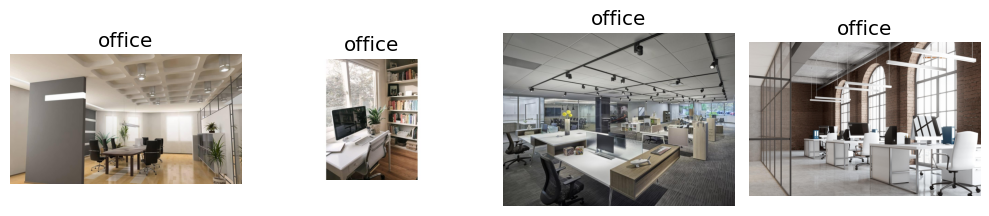

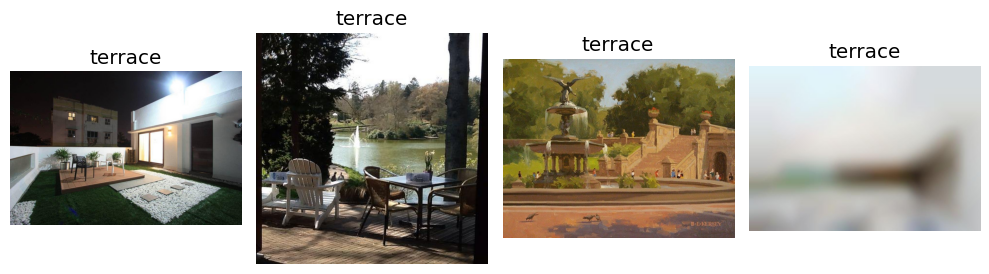

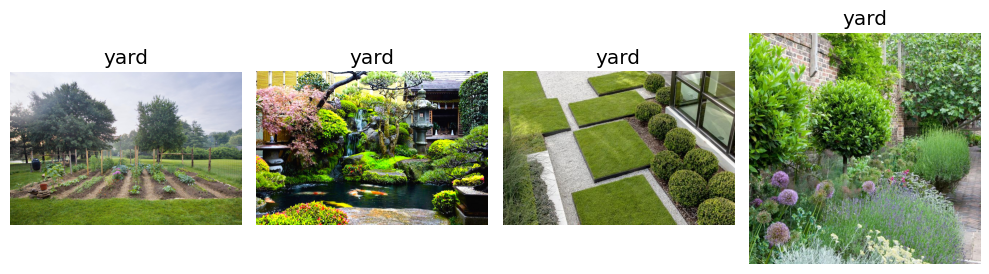

In [102]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Fungsi untuk menampilkan contoh gambar dari setiap kategori
def show_category_images(category):
    category_dir = os.path.join(output_dir, category)
    image_files = os.listdir(category_dir)[:4]  # Mengambil 4 gambar pertama
    
    plt.figure(figsize=(10, 5))
    for i, file_name in enumerate(image_files):
        img_path = os.path.join(category_dir, file_name)
        img = Image.open(img_path)
        
        plt.subplot(1, 4, i + 1)
        plt.imshow(img)
        plt.title(f'{category}')
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Menampilkan gambar-gambar contoh dari setiap kategori
for category in categories:
    show_category_images(category)

### Image Resize

In [89]:
from torchvision import transforms, datasets

# Definisikan transformasi, termasuk RandomResizedCrop
transform = transforms.Compose([
    transforms.RandomResizedCrop(224, scale=(0.3, 1.0))
])

# Membuat dictionary untuk menyimpan hasil transformasi dari setiap kategori
transformed_images = {}

# Fungsi untuk memproses gambar dalam satu kategori
def process_image(category, filename):
    filepath = os.path.join(output_dir, category, filename)
    try:
        # Buka gambar menggunakan PIL
        img = Image.open(filepath)
        # Terapkan transformasi
        transformed_img = transform(img)
        return transformed_img
    except Exception as e:
        print(f"Error processing {filename} in category {category}: {e}")
        return None

# Fungsi untuk memproses gambar dalam satu kategori
def process_category(category):
    category_dir = os.path.join(output_dir, category)
    # Pastikan direktori kategori ada
    if os.path.exists(category_dir):
        print(f"Processing category: {category}")
        transformed_images[category] = []
        # Iterasi melalui setiap gambar di dalam direktori kategori
        for filename in os.listdir(category_dir):
            # Cek jika ini file gambar
            if os.path.isfile(os.path.join(category_dir, filename)):
                transformed_img = process_image(category, filename)
                if transformed_img is not None:
                    transformed_images[category].append(transformed_img)
    else:
        print(f"Category directory '{category_dir}' not found.")

# Gunakan ThreadPoolExecutor untuk memproses setiap kategori dengan threading
start_time = time.time()

with ThreadPoolExecutor() as executor:
    executor.map(process_category, categories)

end_time = time.time()
execution_time = end_time - start_time

print(f"Total execution time: {execution_time} seconds")

# Menampilkan jumlah gambar dalam setiap kategori
for category, images in transformed_images.items():
    print(f"Total {category} files: {len(images)}")

Processing category: bathroom
Processing category: bedroom
Processing category: dining
Processing category: gaming
Processing category: laundry
Processing category: kitchen
Processing category: office
Processing category: living
Processing category: terrace
Processing category: yard
Total execution time: 18.770813465118408 seconds
Total bathroom files: 684
Total bedroom files: 1049
Total dining files: 1116
Total gaming files: 1498
Total laundry files: 1519
Total kitchen files: 1152
Total office files: 1185
Total living files: 1120
Total terrace files: 1176
Total yard files: 1327


#### Contoh gambar setelah resize

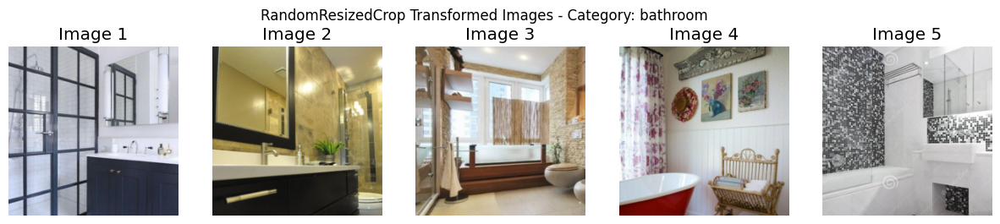

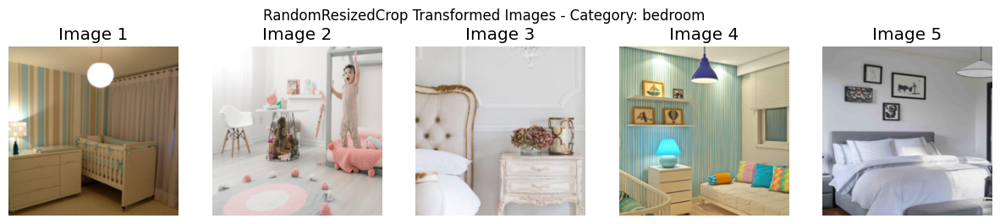

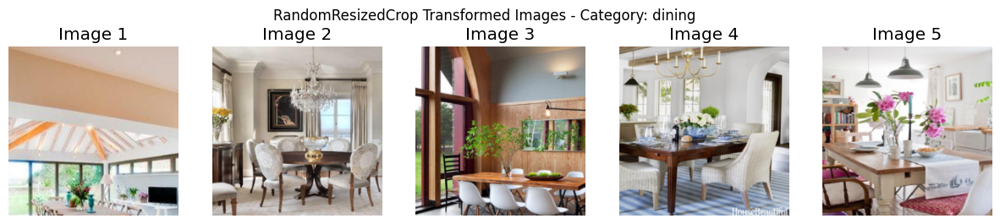

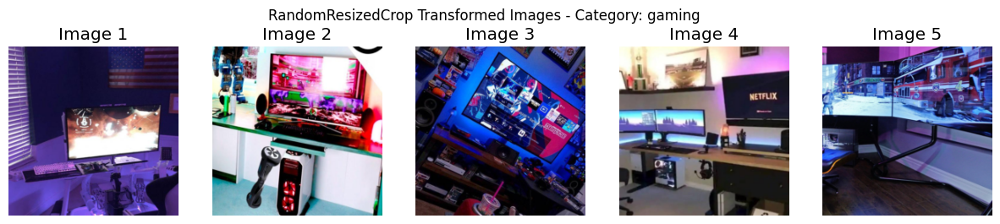

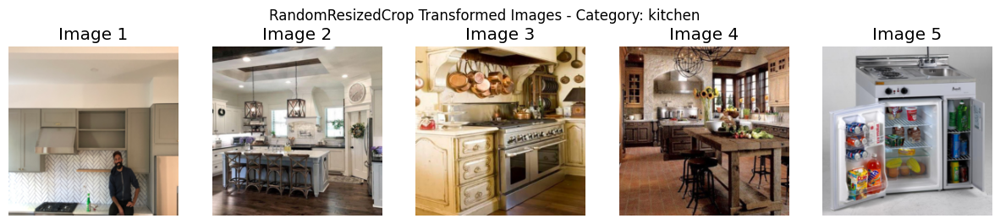

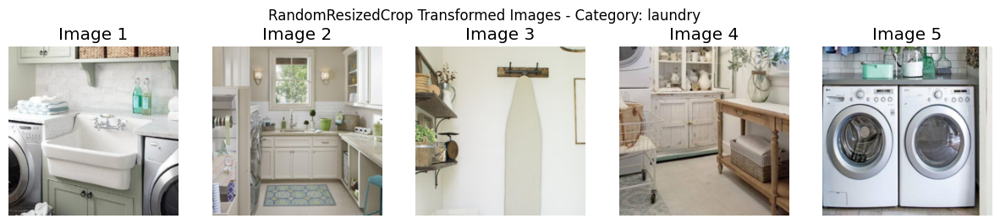

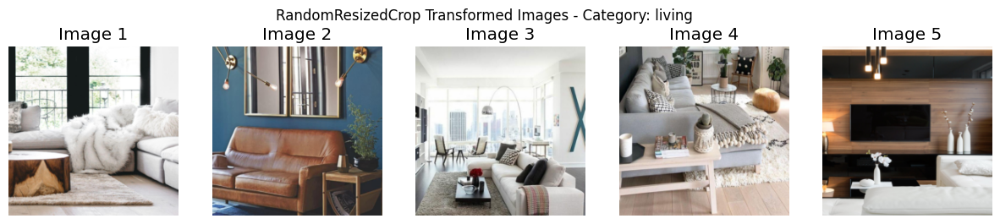

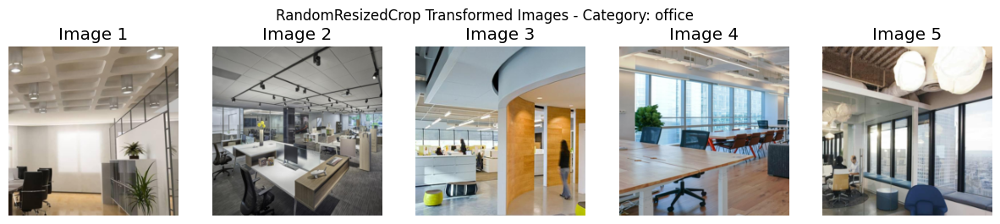

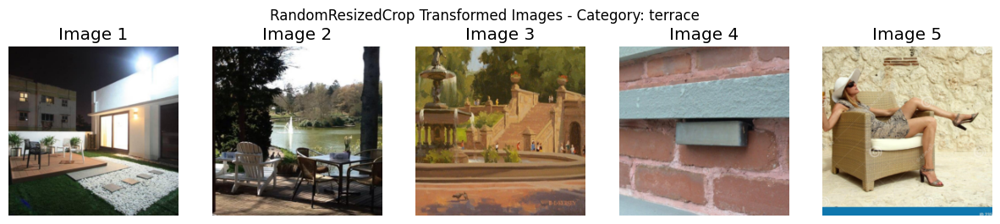

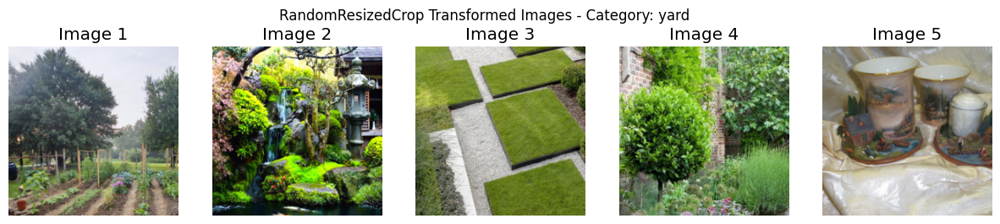

In [77]:
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Tampilkan hasil visualisasi
for category, images in transformed_images.items():
    # Plot lima gambar untuk setiap kategori
    fig, axes = plt.subplots(1, 5, figsize=(15, 3))
    fig.suptitle(f"RandomResizedCrop Transformed Images - Category: {category}")
    
    for i, img in enumerate(images[:5]):  # Hanya menampilkan lima gambar pertama dari setiap kategori
        axes[i].imshow(img)
        axes[i].axis('off')
        axes[i].set_title(f"Image {i+1}")
    
    plt.show()

### CLAHE

In [73]:
# Function to apply CLAHE on an image
def apply_clahe(img_path):
    # Read the image
    img = cv2.imread(img_path)
    if img is None:
        raise ValueError(f"Unable to read image at {img_path}")

    # Convert BGR image to RGB
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Split into RGB channels
    r, g, b = cv2.split(img_rgb)
    
    # Apply CLAHE to each channel
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    cl_r = clahe.apply(r)
    cl_g = clahe.apply(g)
    cl_b = clahe.apply(b)
    
    # Merge channels back into RGB image
    cl_img = cv2.merge([cl_r, cl_g, cl_b])
    
    return cl_img

# Process categories and apply CLAHE after resizing
clahe_transformed_images = {}  # Dictionary to store CLAHE transformed images

for category, images in transformed_images.items():
    clahe_transformed_images[category] = []
    for img in images:  # Assuming images is a list of PIL Image objects
        try:
            # Save the PIL Image to a temporary file and get its path
            temp_img_path = f"temp_image.jpg"
            img.save(temp_img_path)
            
            # Apply CLAHE to the image
            clahe_img = apply_clahe(temp_img_path)
            
            # Append the CLAHE processed image to a new variable
            clahe_transformed_images[category].append(clahe_img)
        except Exception as e:
            print(f"Error processing image with CLAHE: {e}")

# Process categories and apply CLAHE after resizing
start_time_clahe = time.time()

end_time_clahe = time.time()
execution_time_clahe = end_time_clahe - start_time_clahe

print(f"Total execution time for CLAHE: {execution_time_clahe} seconds")

Total execution time for CLAHE: 7.772445678710938e-05 seconds


#### Contoh gambar

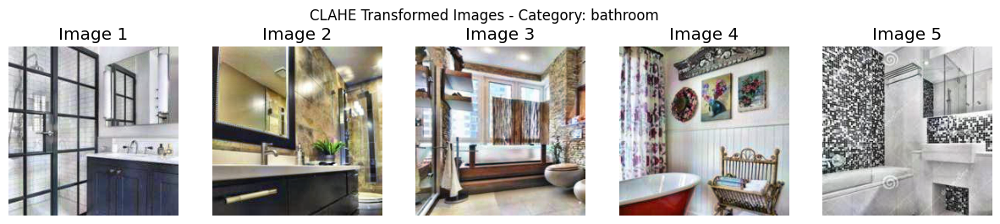

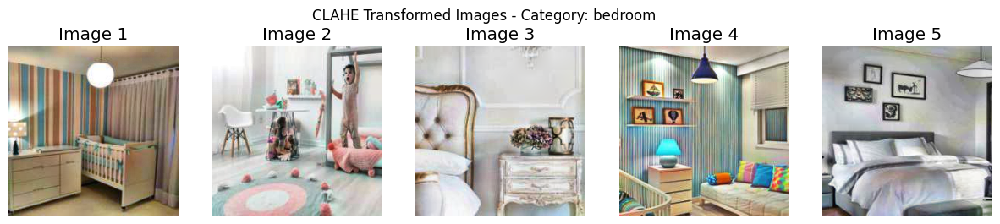

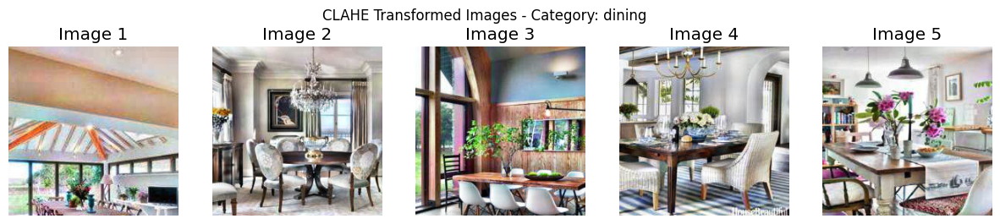

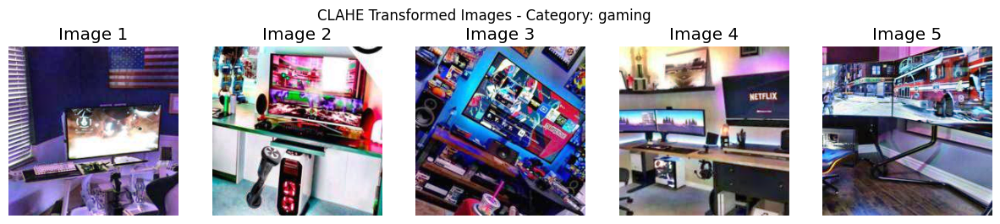

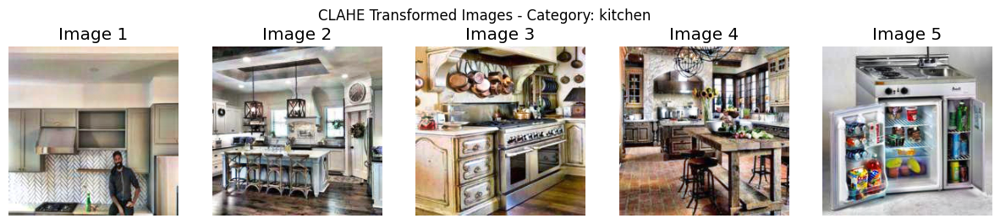

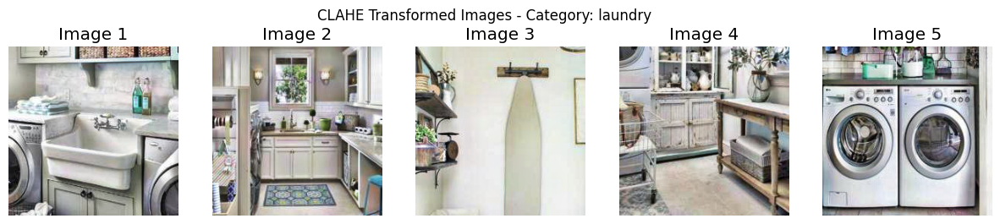

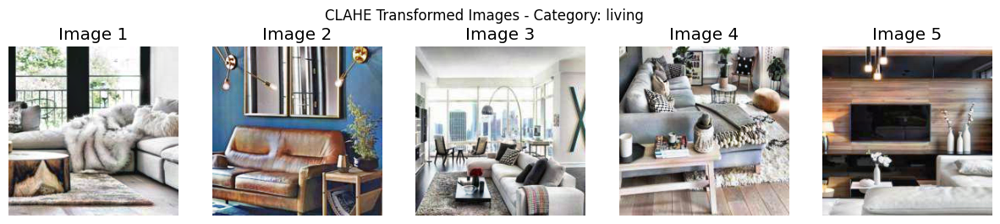

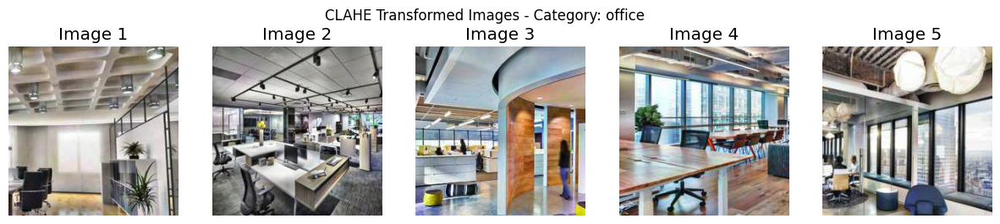

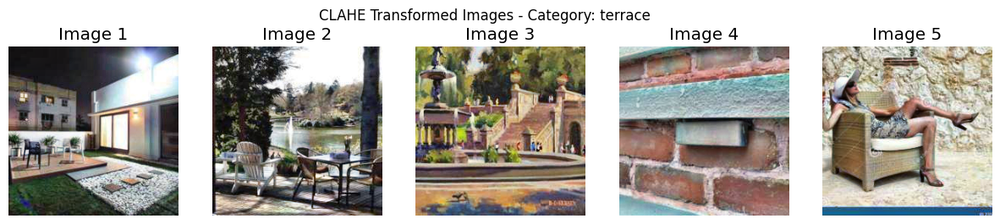

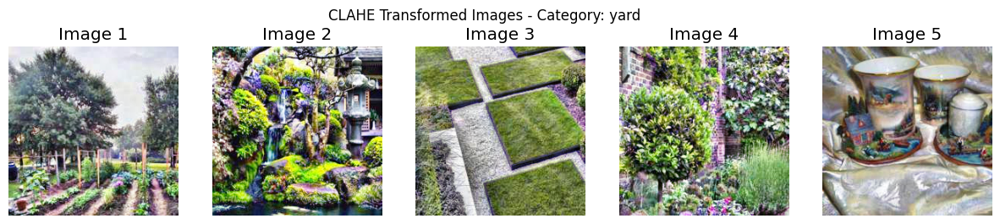

In [78]:
# Tampilkan hasil visualisasi CLAHE
for category, images in clahe_transformed_images.items():
    # Plot lima gambar untuk setiap kategori
    fig, axes = plt.subplots(1, 5, figsize=(15, 3))
    fig.suptitle(f"CLAHE Transformed Images - Category: {category}")
    
    for i, img in enumerate(images[:5]):  # Hanya menampilkan lima gambar pertama dari setiap kategori
        axes[i].imshow(img)
        axes[i].axis('off')
        axes[i].set_title(f"Image {i+1}")
    
    plt.show()

In [83]:
import zipfile
import os

# Direktori yang akan di-zip
directory_to_zip = '/kaggle/working/clahe_processed_images'

# Nama file ZIP yang akan dihasilkan
zip_file_name = '/kaggle/working/clahe_processed_images.zip'

# Kompresi direktori menjadi file ZIP
with zipfile.ZipFile(zip_file_name, 'w') as zipf:
    for root, dirs, files in os.walk(directory_to_zip):
        for file in files:
            zipf.write(os.path.join(root, file), os.path.relpath(os.path.join(root, file), directory_to_zip))

print(f"File ZIP {zip_file_name} berhasil dibuat.")

File ZIP /kaggle/working/clahe_processed_images.zip berhasil dibuat.


In [104]:
# Fungsi untuk menerapkan CLAHE pada gambar
def apply_clahe(img):
    # Convert PIL Image to numpy array
    img_np = np.array(img)
    
    # Convert RGB to BGR (as OpenCV expects images in BGR format)
    img_bgr = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR)
    
    # Split into BGR channels
    b, g, r = cv2.split(img_bgr)
    
    # Apply CLAHE to each channel
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    cl_b = clahe.apply(b)
    cl_g = clahe.apply(g)
    cl_r = clahe.apply(r)
    
    # Merge channels back into BGR image
    cl_img_bgr = cv2.merge([cl_b, cl_g, cl_r])
    
    # Convert BGR to RGB
    cl_img_rgb = cv2.cvtColor(cl_img_bgr, cv2.COLOR_BGR2RGB)
    
    # Convert numpy array back to PIL Image
    cl_img = Image.fromarray(cl_img_rgb)
    
    return cl_img

def process_image(source_file, category):
    destination_dir = os.path.join(output_dir, category)
    os.makedirs(destination_dir, exist_ok=True)
    destination_file = os.path.join(destination_dir, os.path.basename(source_file))
    
    try:
        with Image.open(source_file) as img:
            if img.mode != 'RGB':
                img = img.convert('RGB')
            img = transform(img)
            img = apply_clahe(img)
            img.save(destination_file)
            return img.mode
    except Exception as e:
        print(f"Error processing file {source_file}: {e}")
        return None

if __name__ == '__main__':
    # Mengumpulkan file yang akan diproses
    file_infos = [(os.path.join(root, file), os.path.basename(root))
                  for root, _, files in os.walk(img_path)
                  for file in files if os.path.basename(root) in categories]

    # Tentukan jumlah workers sesuai jumlah CPU yang tersedia
    num_workers = multiprocessing.cpu_count()

    # Mencatat waktu mulai
    start_time = time.time()

    # Memproses gambar dengan joblib
    results = Parallel(n_jobs=num_workers)(delayed(process_image)(*file_info) for file_info in file_infos)

    # Mencatat waktu selesai
    end_time = time.time()

    # Menampilkan jumlah file dalam setiap kategori
    for category in categories:
        num_files = len(os.listdir(os.path.join(output_dir, category)))
        print(f"Total {category} files: {num_files}")

    # Menampilkan tipe gambar yang ditemukan dalam dataset
    image_modes = {}
    for mode in results:
        if mode:
            image_modes[mode] = image_modes.get(mode, 0) + 1

    print("\nImage modes found in dataset:")
    for mode, count in image_modes.items():
        print(f"{mode}: {count} files")

    # Menampilkan waktu eksekusi
    execution_time = end_time - start_time
    print(f"\nTotal execution time: {execution_time:.2f} seconds")

/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/PIL/TiffImagePlugin.py:864: UserWarning: Truncated File Read
  warnings.warn(str(msg))
/opt/conda/lib/python3.10/site-packages/PIL/TiffImagePlugin.py:864: UserWarning: Truncated File Read
  warnings.warn(str(msg))


Total bathroom files: 740
Total bedroom files: 1083
Total dining files: 1178
Total gaming files: 1511
Total kitchen files: 1208
Total laundry files: 1589
Total living files: 1164
Total office files: 1241
Total terrace files: 1210
Total yard files: 1398

Image modes found in dataset:
RGB: 12322 files

Total execution time: 267.87 seconds


In [13]:
from torchvision import transforms, datasets
import multiprocessing
import time
from joblib import Parallel, delayed
import zipfile
import os

# Definisikan transformasi, termasuk RandomResizedCrop
transform = transforms.Compose([
    transforms.RandomResizedCrop(224, scale=(0.3, 1.0))
])


# Fungsi untuk menerapkan CLAHE pada gambar
def apply_clahe(img):
    # Convert PIL Image to numpy array
    img_np = np.array(img)
    
    # Convert RGB to BGR (as OpenCV expects images in BGR format)
    img_bgr = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR)
    
    # Split into BGR channels
    b, g, r = cv2.split(img_bgr)
    
    # Apply CLAHE to each channel
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    cl_b = clahe.apply(b)
    cl_g = clahe.apply(g)
    cl_r = clahe.apply(r)
    
    # Merge channels back into BGR image
    cl_img_bgr = cv2.merge([cl_b, cl_g, cl_r])
    
    # Convert BGR to RGB
    cl_img_rgb = cv2.cvtColor(cl_img_bgr, cv2.COLOR_BGR2RGB)
    
    # Convert numpy array back to PIL Image
    cl_img = Image.fromarray(cl_img_rgb)
    
    return cl_img

def process_image(source_file, category):
    destination_dir = os.path.join(output_dir, category)
    os.makedirs(destination_dir, exist_ok=True)
    destination_file = os.path.join(destination_dir, os.path.basename(source_file))
    
    try:
        with Image.open(source_file) as img:
            if img.mode != 'RGB':
                img = img.convert('RGB')
            img = transform(img)
            img = apply_clahe(img)
            img.save(destination_file)
            return img.mode
    except Exception as e:
        print(f"Error processing file {source_file}: {e}")
        return None

if __name__ == '__main__':
    # Mengumpulkan file yang akan diproses
    file_infos = [(os.path.join(root, file), os.path.basename(root))
                  for root, _, files in os.walk(img_path)
                  for file in files if os.path.basename(root) in categories]

    # Tentukan jumlah workers sesuai jumlah CPU yang tersedia
    num_workers = multiprocessing.cpu_count()

    # Mencatat waktu mulai
    start_time = time.time()

    # Memproses gambar dengan joblib
    results = Parallel(n_jobs=num_workers)(delayed(process_image)(*file_info) for file_info in file_infos)

    # Mencatat waktu selesai
    end_time = time.time()

    # Menampilkan jumlah file dalam setiap kategori
    for category in categories:
        num_files = len(os.listdir(os.path.join(output_dir, category)))
        print(f"Total {category} files: {num_files}")

    # Menampilkan tipe gambar yang ditemukan dalam dataset
    image_modes = {}
    for mode in results:
        if mode:
            image_modes[mode] = image_modes.get(mode, 0) + 1

    print("\nImage modes found in dataset:")
    for mode, count in image_modes.items():
        print(f"{mode}: {count} files")

    # Menampilkan waktu eksekusi
    execution_time = end_time - start_time
    print(f"\nTotal execution time: {execution_time:.2f} seconds")
    
    # Nama file ZIP yang akan dihasilkan
    zip_file_name = '/kaggle/working/clahe_processed_images.zip'

    # Kompresi direktori menjadi file ZIP
    with zipfile.ZipFile(zip_file_name, 'w') as zipf:
        for root, dirs, files in os.walk(output_dir):
            for file in files:
                zipf.write(os.path.join(root, file), os.path.relpath(os.path.join(root, file), output_dir))

    print(f"File ZIP {zip_file_name} berhasil dibuat.")

/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/PIL/TiffImagePlugin.py:864: UserWarning: Truncated File Read
  warnings.warn(str(msg))


Total bathroom files: 740
Total bedroom files: 1083
Total dining files: 1178
Total gaming files: 1511
Total kitchen files: 1208
Total laundry files: 1589
Total living files: 1164
Total office files: 1241
Total terrace files: 1210
Total yard files: 1398

Image modes found in dataset:
RGB: 12322 files

Total execution time: 239.40 seconds
File ZIP /kaggle/working/clahe_processed_images.zip berhasil dibuat.


In [16]:
from IPython.display import FileLink

zipfilen = '/kaggle/working/clahe_processed_images.zip'
# Generate and display the download link

FileLink(zipfilen)

/kaggle/working/clahe_processed_images.zip

In [17]:
!zip -r file.zip '/kaggle/working/clahe_processed_images.zip'

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


  adding: kaggle/working/clahe_processed_images.zip (stored 0%)
